<a href="https://colab.research.google.com/github/Jef-H/unsupervised_exoplanets/blob/develop/First_Pass.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

With your dataset from the previous EDA assignment, compare at least 3 different unsupervised methods. They all might not answer your earth science question (some are dimensionality reduction, some are clustering, feel free to mix and match).

All of these methods are in scikit-learn

    Links to an external site.. Feel free to use a LLM (claude, chatGPT, etc.) to help generate code and markdown.

    Pick from the below list:

    KMeans
    DBScan
    TSNE
    PCA
    UMAP
    Gaussian Mixture

    As part of this comparison, I expect 1-2 plots for each doing data viz, scoring (not all methods can be scored, but many of them can!), and a little write up using a markdown cell.

    Answer these questions at the bottom using markdown (one markdown cell per answer).
    Which method did you like the most?
    Which method did you like the least?
    How did you score these unsupervised models?  
    Did the output align with your geologic understanding?
    What did you want to learn more about?
    Did you pre-process your data?
    What was a decision you were most unsure about?



Make a post on slack with the link to the notebook. If I don't see the slack post, I can mark this a 0.



In [14]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns

In [15]:
# Read in the Planet Candidate clean dataset.
url = 'https://raw.githubusercontent.com/Jef-H/unsupervised_exoplanets/develop/TESS_project_candidates_clean.csv'
df = pd.read_csv(url)


In [16]:
df.describe()

,toi,toipfx,pl_orbper,pl_rade,pl_insol,st_tmag,st_dist,st_teff,st_logg,st_rad
count,7358.000000,7358.000000,7256.000000,6874.000000,7202.000000,7358.000000,7147.000000,7214.000000,6542.000000,6874.000000
mean,3585.072736,3585.062245,17.993210,10.324896,2254.521765,11.527877,475.692040,5798.666507,4.305184,1.407948
std,2055.197058,2055.197409,98.481552,8.655134,10719.704497,1.637732,566.010695,1500.071273,0.305602,1.629440
min,101.010000,101.000000,0.152076,0.552507,0.000342,4.627800,6.531270,2808.000000,0.100000,0.114827
25%,1788.260000,1788.250000,2.460728,4.399826,85.967076,10.359500,176.400500,5205.850000,4.123918,0.890000
50%,3567.510000,3567.500000,4.078383,10.504180,365.852081,11.781250,360.072000,5801.500000,4.330000,1.240000
75%,5372.760000,5372.750000,7.906320,14.045700,1174.535000,12.837675,642.938000,6303.650000,4.500000,1.660810
max,7175.010000,7175.000000,1837.889731,297.111726,280833.000000,18.332400,14728.300000,50000.000000,5.960650,102.030000


In [23]:
print(df.dtypes)

toi            float64
toipfx           int64
tfopwg_disp     object
pl_orbper      float64
pl_rade        float64
pl_insol       float64
st_tmag        float64
st_dist        float64
st_teff        float64
st_logg        float64
st_rad         float64
dtype: object


In [24]:
# Placeholder DataFrame to simulate your data
columns = df.columns
# Step 1: Clustering with all columns
# Scaling the data
# Step 1: Preprocessing and Scaling the Data
# Selecting only numeric columns for scaling (excluding the categorical column)
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
# Remove the 'tfopwg_disp' column if it was dropped, or include the encoded version
columns_to_scale = numeric_columns.drop('tfopwg_disp', errors='ignore')  # Avoid scaling the original categorical column

# Scaling the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[columns_to_scale])

Column Data Types:
 toi            float64
toipfx           int64
tfopwg_disp     object
pl_orbper      float64
pl_rade        float64
pl_insol       float64
st_tmag        float64
st_dist        float64
st_teff        float64
st_logg        float64
st_rad         float64
dtype: object
Non-Numeric Columns: Index(['tfopwg_disp'], dtype='object')
Missing values after removing non-numeric columns: toi            0
toipfx         0
pl_orbper    102
pl_rade      484
pl_insol     156
st_tmag        0
st_dist      211
st_teff      144
st_logg      816
st_rad       484
dtype: int64


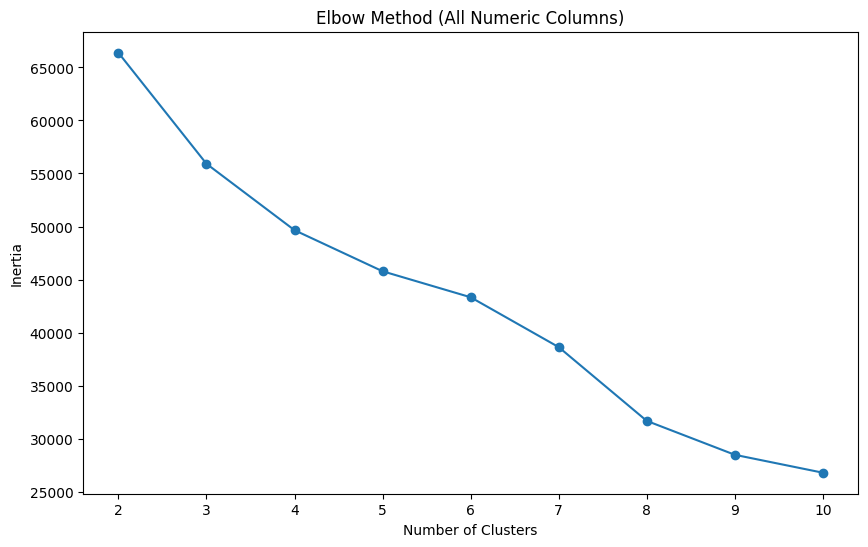

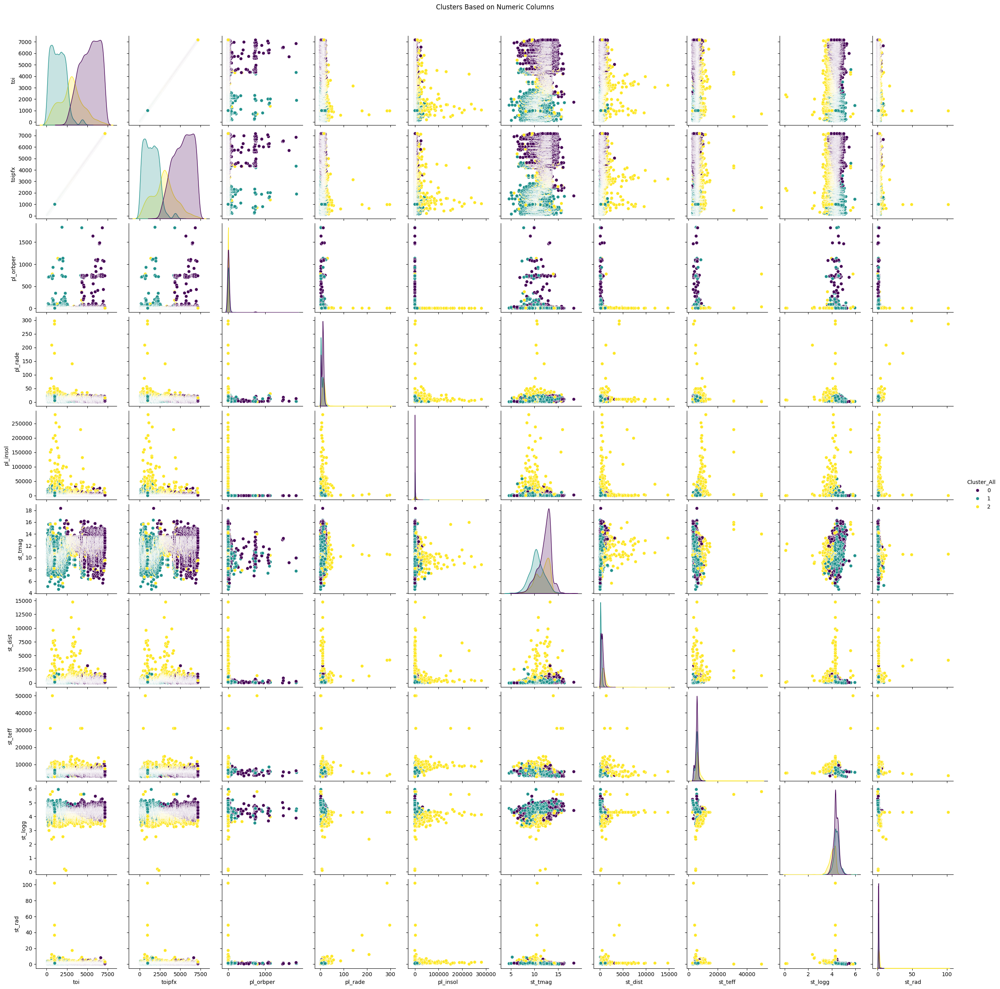

Cluster Sizes (All Numeric Columns):
 Cluster_All
0    3409
1    2278
2    1671
Name: count, dtype: int64


In [28]:
# Check the types of all columns to find the non-numeric ones
print("Column Data Types:\n", df.dtypes)

# Identify non-numeric columns
non_numeric_columns = df.select_dtypes(exclude=['float64', 'int64']).columns
print("Non-Numeric Columns:", non_numeric_columns)

# Handle non-numeric columns
# Option 1: Remove non-numeric columns (if they are irrelevant for clustering)
df.drop(columns=non_numeric_columns, inplace=True)

# Option 2: If you want to keep the non-numeric columns, you can encode them.
# For example, let's use LabelEncoder for the 'tfopwg_disp' column if it's a categorical text column.
from sklearn.preprocessing import LabelEncoder

if 'tfopwg_disp' in df.columns:
    le = LabelEncoder()
    df['tfopwg_disp_encoded'] = le.fit_transform(df['tfopwg_disp'].astype(str))

# Check again for missing values after handling non-numeric columns
print("Missing values after removing non-numeric columns:", df.isna().sum())

# Fill missing values in the numeric columns
df.fillna(df.mean(), inplace=True)

# Now proceed with scaling the data
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
columns_to_scale = numeric_columns.drop('tfopwg_disp', errors='ignore')  # Avoid scaling the original categorical column

# Scaling the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[columns_to_scale])

# K-means clustering (Elbow method)
inertia = []
range_n_clusters = range(2, 11)
for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(scaled_data)
    inertia.append(kmeans.inertia_)

# Plot the Elbow Method
plt.figure(figsize=(10, 6))
plt.plot(range_n_clusters, inertia, marker='o')
plt.title("Elbow Method (All Numeric Columns)")
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.show()

# Proceed with final clustering
kmeans_all = KMeans(n_clusters=3, random_state=42)
df['Cluster_All'] = kmeans_all.fit_predict(scaled_data)

# Visualizing clusters
sns.pairplot(df, vars=columns_to_scale, hue='Cluster_All', palette='viridis', diag_kind='kde')
plt.suptitle("Clusters Based on Numeric Columns", y=1.02)
plt.show()

# Summary of cluster sizes
print("Cluster Sizes (All Numeric Columns):\n", df['Cluster_All'].value_counts())

# Save the clustered DataFrame
df.to_csv('clustered_data.csv', index=False)

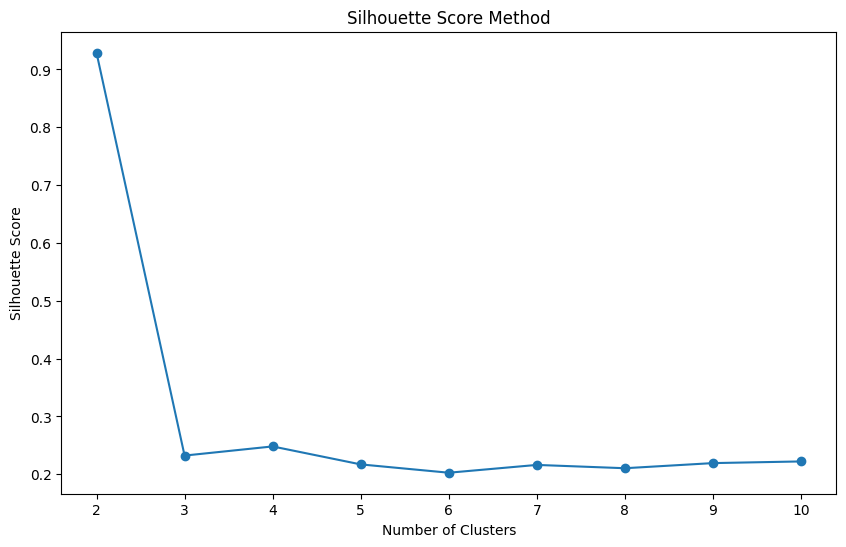

The optimal number of clusters is: 2


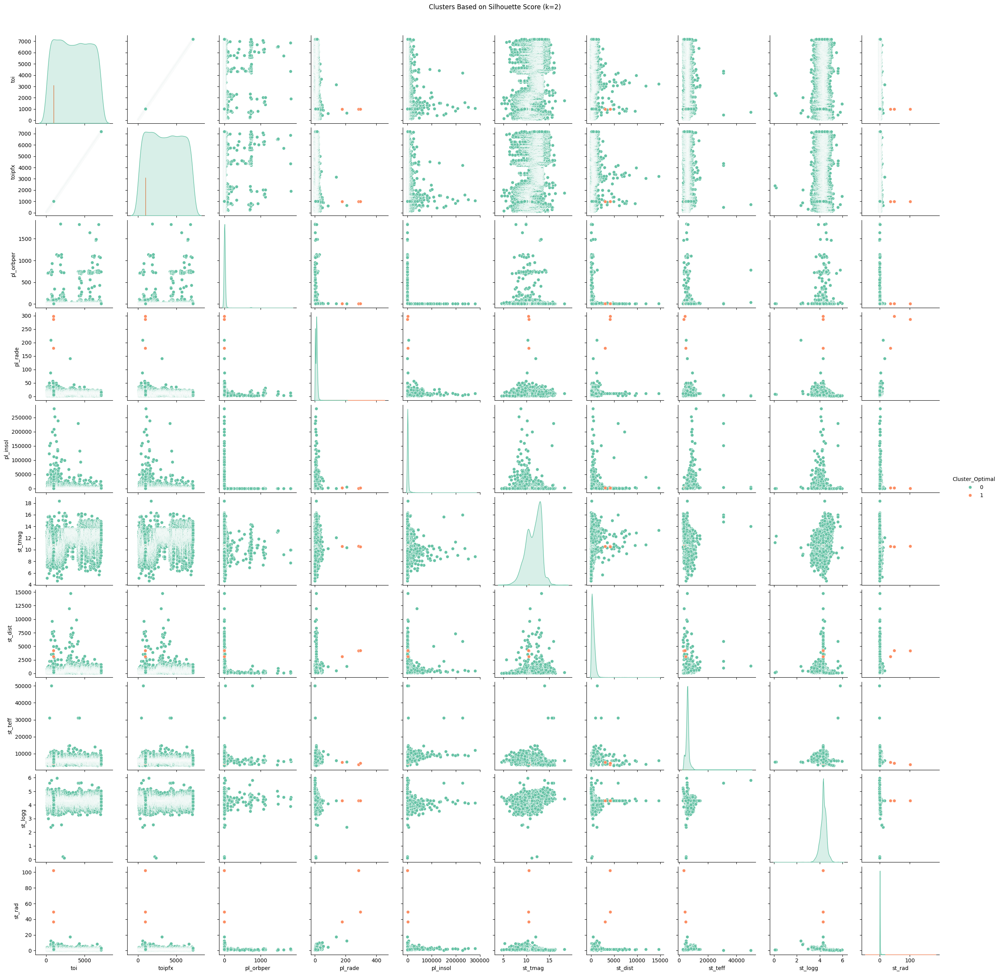

Cluster Sizes (Optimal Clusters):
 Cluster_Optimal
0    7355
1       3
Name: count, dtype: int64


In [30]:
from sklearn.metrics import silhouette_score

# List to store silhouette scores for different cluster numbers
sil_scores = []
range_n_clusters = range(2, 11)

# Calculate silhouette score for different cluster numbers
for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(scaled_data)

    # Calculate the silhouette score
    score = silhouette_score(scaled_data, cluster_labels)
    sil_scores.append(score)

# Plot the Silhouette Scores
plt.figure(figsize=(10, 6))
plt.plot(range_n_clusters, sil_scores, marker='o')
plt.title("Silhouette Score Method")
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.show()

# Determine the optimal number of clusters based on the highest silhouette score
optimal_clusters = range_n_clusters[sil_scores.index(max(sil_scores))]
print(f"The optimal number of clusters is: {optimal_clusters}")

# Perform K-means with the optimal number of clusters
kmeans_optimal = KMeans(n_clusters=optimal_clusters, random_state=42)
df['Cluster_Optimal'] = kmeans_optimal.fit_predict(scaled_data)

# Visualizing the clusters with the optimal number of clusters
sns.pairplot(df, vars=numeric_columns, hue='Cluster_Optimal', palette='Set2', diag_kind='kde')
plt.suptitle(f"Clusters Based on Silhouette Score (k={optimal_clusters})", y=1.02)
plt.show()

# Summary of cluster sizes
print(f"Cluster Sizes (Optimal Clusters):\n", df['Cluster_Optimal'].value_counts())

# Save the clustered DataFrame
df.to_csv('clustered_data_optimal.csv', index=False)

Cluster Assignments (labels_):
[2 2 2 ... 1 2 1]

Cluster Centers (cluster_centers_):
[[ 0.83305255  0.83305254  0.0486405  -0.07367805 -0.14560091  0.36899266
  -0.05244598 -0.18199493  0.19485997 -0.13512162]
 [-1.04787595 -1.04787614  0.01521754 -0.357947   -0.09205552 -0.62902318
  -0.47031009 -0.23787667  0.36998151 -0.16049769]
 [-0.28035799 -0.28035772 -0.12095008  0.64162576  0.42570821  0.10150652
   0.75172873  0.70022508 -0.90753545  0.49782389]]

Inertia (inertia_):
55919.05334743892


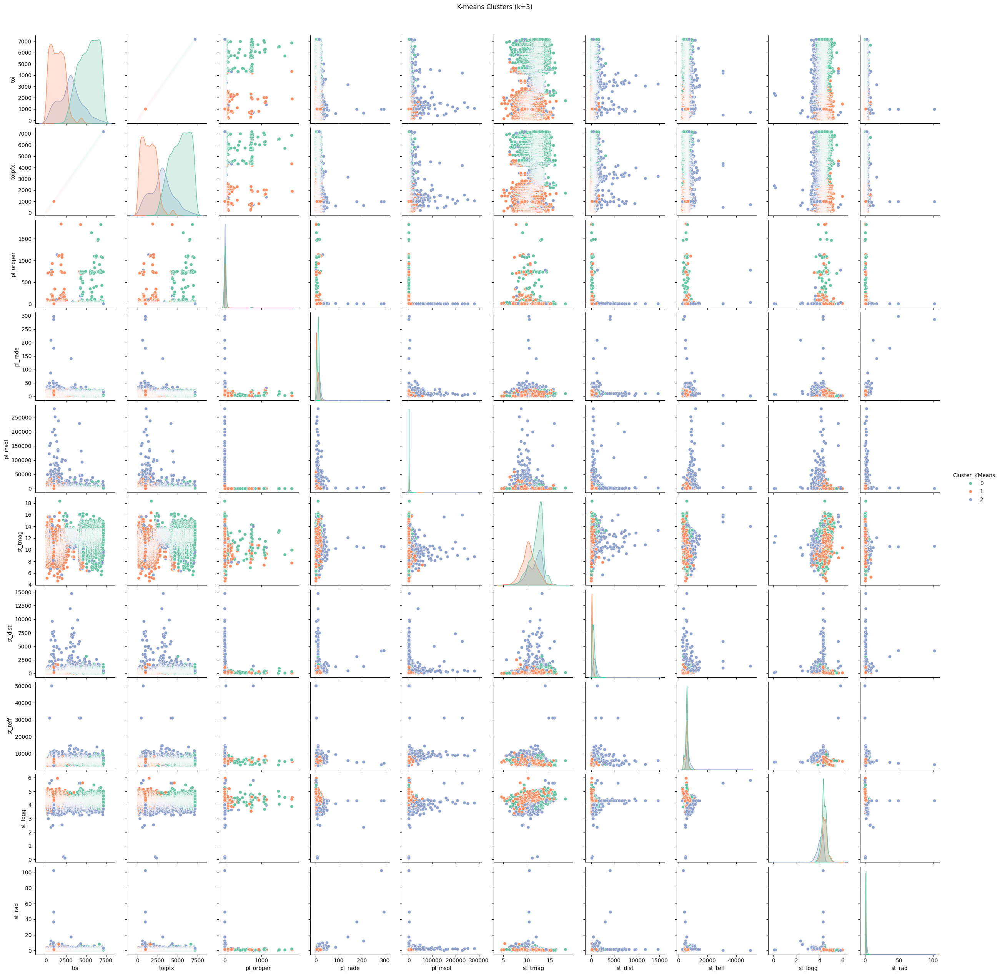

Cluster Sizes (K-means):
 Cluster_KMeans
0    3409
1    2278
2    1671
Name: count, dtype: int64


In [37]:
# Fit K-means with the optimal number of clusters (e.g., 3 clusters in this case)
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(scaled_data)

# 1. Examine the labels_ (cluster assignments for each data point)
print("Cluster Assignments (labels_):")
print(kmeans.labels_)

# 2. Check the cluster centers (coordinates of the centroids)
print("\nCluster Centers (cluster_centers_):")
print(kmeans.cluster_centers_)

# 3. Review the inertia (sum of squared distances of samples to their cluster center)
print("\nInertia (inertia_):")
print(kmeans.inertia_)

# Add the cluster assignments to the DataFrame for further analysis
df['Cluster_KMeans'] = kmeans.labels_

# Visualizing the K-means clusters
sns.pairplot(df, vars=numeric_columns, hue='Cluster_KMeans', palette='Set2', diag_kind='kde')
plt.suptitle(f"K-means Clusters (k=3)", y=1.02)
plt.show()

# Summary of cluster sizes
print(f"Cluster Sizes (K-means):\n", df['Cluster_KMeans'].value_counts())

# Save the clustered DataFrame
df.to_csv('clustered_data_kmeans.csv', index=False)

   eps  min_samples  num_clusters  num_noise
0  0.5            5            17       2539
1  0.5           10             4       3353
2  0.5           20             7       4875
3  1.0            5             6        548
4  1.0           10             1        672
5  1.0           20             1        816
6  1.5            5             7        215
7  1.5           10             3        295
8  1.5           20             1        378
Best DBSCAN Result:
 eps                0.5
min_samples        5.0
num_clusters      17.0
num_noise       2539.0
Name: 0, dtype: float64


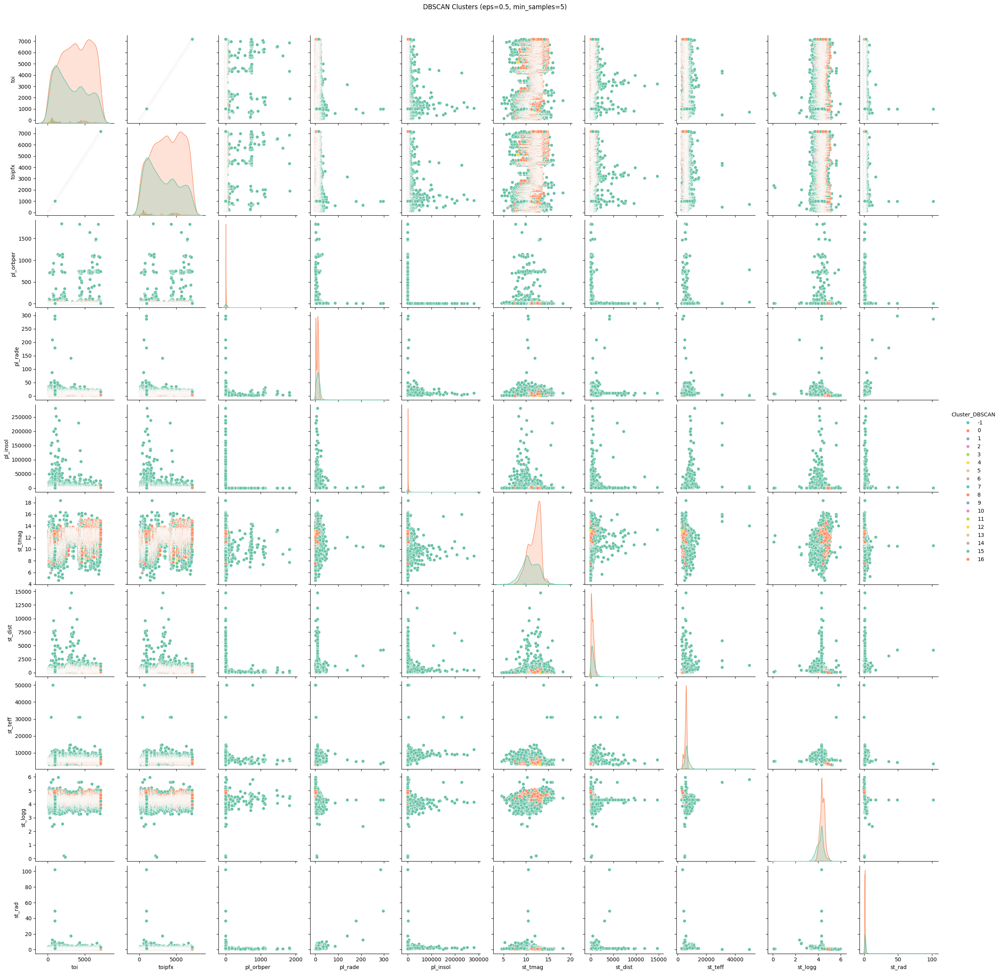

Cluster Sizes (DBSCAN):
 Cluster_DBSCAN
 0     4720
-1     2539
 4       19
 10      17
 9        8
 1        6
 6        6
 12       5
 11       5
 8        5
 14       4
 7        4
 5        4
 15       4
 2        4
 3        3
 13       3
 16       2
Name: count, dtype: int64


In [36]:
from sklearn.cluster import DBSCAN
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Experiment with different eps and min_samples values
eps_values = [0.5, 1.0, 1.5]  # Max distance for points to be considered neighbors
min_samples_values = [5, 10, 20]  # Minimum number of points required to form a dense region

# List to store clustering results
dbscan_results = []

for eps in eps_values:
    for min_samples in min_samples_values:
        # Perform DBSCAN clustering
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        cluster_labels = dbscan.fit_predict(scaled_data)

        # Store the results (eps, min_samples, number of clusters, number of noise points)
        num_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)
        num_noise = list(cluster_labels).count(-1)
        dbscan_results.append({
            'eps': eps,
            'min_samples': min_samples,
            'num_clusters': num_clusters,
            'num_noise': num_noise
        })

# Convert results to DataFrame
dbscan_df = pd.DataFrame(dbscan_results)

# Display the results for different eps and min_samples values
print(dbscan_df)

# Select the best combination based on desired number of clusters or noise
# For now, we'll choose the first row with the maximum number of clusters
best_result = dbscan_df.loc[dbscan_df['num_clusters'].idxmax()]
print("Best DBSCAN Result:\n", best_result)

# Ensure min_samples is an integer
best_eps = best_result['eps']
best_min_samples = int(best_result['min_samples'])  # Fix: Convert to integer

# Apply DBSCAN with the best parameters
dbscan_best = DBSCAN(eps=best_eps, min_samples=best_min_samples)
df['Cluster_DBSCAN'] = dbscan_best.fit_predict(scaled_data)

# Visualize the clusters
sns.pairplot(df, vars=numeric_columns, hue='Cluster_DBSCAN', palette='Set2', diag_kind='kde')
plt.suptitle(f"DBSCAN Clusters (eps={best_eps}, min_samples={best_min_samples})", y=1.02)
plt.show()

# Summary of cluster sizes
print(f"Cluster Sizes (DBSCAN):\n", df['Cluster_DBSCAN'].value_counts())

# Save the clustered DataFrame
df.to_csv('clustered_data_dbscan.csv', index=False)

Best GMM Result:
 n_components                                                     10
bic                                                   -74510.153586
aic                                                    -79059.58871
cluster_labels    [4, 4, 4, 9, 6, 8, 4, 2, 4, 9, 5, 6, 1, 6, 9, ...
Name: 9, dtype: object


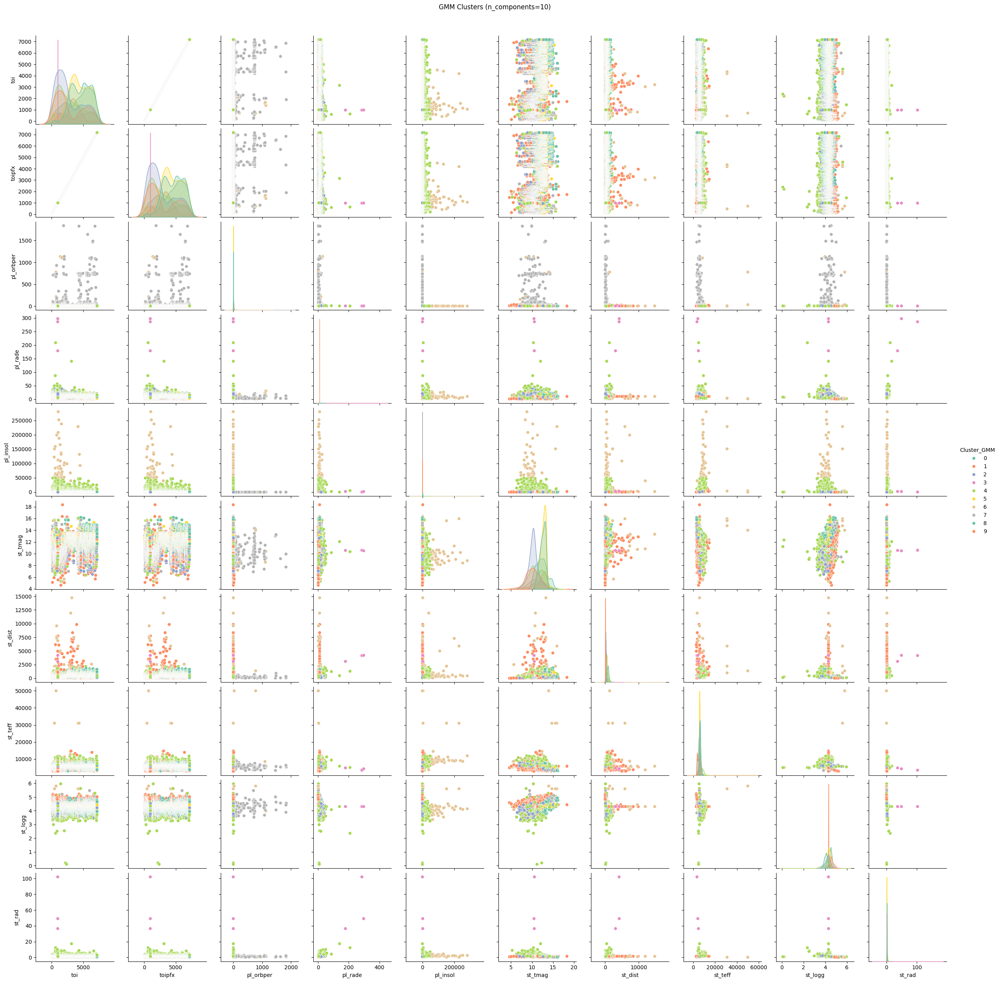

Cluster Sizes (GMM):
 Cluster_GMM
5    1271
2    1241
0    1102
8    1042
4     938
1     812
9     441
7     418
6      90
3       3
Name: count, dtype: int64


In [38]:
from sklearn.mixture import GaussianMixture
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Number of clusters (components) you want to try
n_components_range = range(1, 11)  # You can experiment with this range

# List to store results
gmm_results = []

for n_components in n_components_range:
    # Fit a Gaussian Mixture Model with n_components
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    gmm.fit(scaled_data)

    # Predict the cluster labels
    cluster_labels = gmm.predict(scaled_data)

    # Store the results
    gmm_results.append({
        'n_components': n_components,
        'bic': gmm.bic(scaled_data),  # Bayesian Information Criterion
        'aic': gmm.aic(scaled_data),  # Akaike Information Criterion
        'cluster_labels': cluster_labels
    })

# Convert the results to a DataFrame for easy comparison
gmm_df = pd.DataFrame(gmm_results)

# Find the best number of components based on BIC or AIC
best_result = gmm_df.loc[gmm_df['bic'].idxmin()]  # Choose the model with the lowest BIC
print("Best GMM Result:\n", best_result)

# Apply the best GMM to the data
best_n_components = best_result['n_components']
best_gmm = GaussianMixture(n_components=best_n_components, random_state=42)
df['Cluster_GMM'] = best_gmm.fit_predict(scaled_data)

# Visualize the clusters (optional, pairplot is used here)
sns.pairplot(df, vars=numeric_columns, hue='Cluster_GMM', palette='Set2', diag_kind='kde')
plt.suptitle(f"GMM Clusters (n_components={best_n_components})", y=1.02)
plt.show()

# Summary of cluster sizes
print(f"Cluster Sizes (GMM):\n", df['Cluster_GMM'].value_counts())

# Save the clustered DataFrame
df.to_csv('clustered_data_gmm.csv', index=False)



Answer these questions at the bottom using markdown (one markdown cell per answer).
1. Which method did you like the most?
2. Which method did you like the least?
3. How did you score these unsupervised models?  
4. Did the output align with your geologic understanding?
5. What did you want to learn more about?
6. Did you pre-process your data?
7. What was a decision you were most unsure about?